<a href="https://colab.research.google.com/github/abhyudyasangwan/Ad-Campaign-Model/blob/main/Ad_Campaign.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Data Preprocessing

In [69]:
import pandas as pd
df = pd.read_csv("Market.csv")
df

,Campaign,Date,City/Location,Latitude,Longitude,Channel,Device,Ad,Impressions,"CTR, %",Clicks,Daily Average CPC,"Spend, GBP",Conversions,"Total conversion value, GBP",Likes (Reactions),Shares,Comments
0,Spring,3/1/2023,Birmingham,52.489471,-1.898575,Facebook,Desktop,Collection,1110.8,1.9%,21,1.39,29,1,51.84,45,4,3
1,Spring,3/2/2023,Birmingham,52.489471,-1.898575,Facebook,Desktop,Collection,1296.6,1.1%,14,0.72,10,2,40.32,14,17,11
2,Spring,3/3/2023,Birmingham,52.489471,-1.898575,Facebook,Desktop,Collection,1264.4,1.3%,17,0.38,6,4,53.76,24,1,8
3,Spring,3/4/2023,Birmingham,52.489471,-1.898575,Facebook,Desktop,Collection,837.8,1.6%,13,0.58,8,3,25.92,59,10,6
4,Spring,3/5/2023,Birmingham,52.489471,-1.898575,Facebook,Desktop,Collection,1599.0,1.4%,23,0.83,19,2,108.19,44,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9895,Fall,11/26/2023,Manchester,53.483959,-2.244644,Pinterest,Mobile,Discount,2382.0,1.2%,29,0.24,7,4,365.00,95,20,4
9896,Fall,11/27/2023,Manchester,53.483959,-2.244644,Pinterest,Mobile,Discount,2238.0,1.0%,21,0.81,17,6,341.00,82,18,8
9897,Fall,11/28/2023,Manchester,53.483959,-2.244644,Pinterest,Mobile,Discount,2423.0,1.3%,31,0.31,9,3,232.00,64,12,5
9898,Fall,11/29/2023,Manchester,53.483959,-2.244644,Pinterest,Mobile,Discount,1778.0,1.1%,19,0.88,17,4,305.00,88,15,1


Columns like Date, Latitude and Longitude don't have effect on campaign performance due to the following reasons:

1) **Date:** Since all the dates are divided amongst seasons on "Campaign" column, it is a much bigger bracket to judge the performance of the campaign over the seasons(Larger unit of time).

2) **Longitude and Latitude:** Since we already have a feature "City/Location", we will incorporate the dependency of the performance with region there, instead of catering to Longitudes and Latitudes which are highly variable.

In [70]:
# Droping unnecessary columns
df = df.drop(['Date', 'Latitude', 'Longitude'], axis=1)

#One-Hot Encoding
categorical_columns = ['Campaign', 'City/Location', 'Channel', 'Device', 'Ad']
df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)
encoded_columns = [col for col in df.columns if any(cat in col for cat in categorical_columns)]

# Converting one-hot encoded columns to integers
df[encoded_columns] = df[encoded_columns].astype(int)
df = df.dropna()
df

,Impressions,"CTR, %",Clicks,Daily Average CPC,"Spend, GBP",Conversions,"Total conversion value, GBP",Likes (Reactions),Shares,Comments,Campaign_Spring,Campaign_Summer,City/Location_London,City/Location_Manchester,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount
0,1110.8,1.9%,21,1.39,29,1,51.84,45,4,3,1,0,0,0,0,0,0,0
1,1296.6,1.1%,14,0.72,10,2,40.32,14,17,11,1,0,0,0,0,0,0,0
2,1264.4,1.3%,17,0.38,6,4,53.76,24,1,8,1,0,0,0,0,0,0,0
3,837.8,1.6%,13,0.58,8,3,25.92,59,10,6,1,0,0,0,0,0,0,0
4,1599.0,1.4%,23,0.83,19,2,108.19,44,17,2,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9895,2382.0,1.2%,29,0.24,7,4,365.00,95,20,4,0,0,0,1,0,1,1,1
9896,2238.0,1.0%,21,0.81,17,6,341.00,82,18,8,0,0,0,1,0,1,1,1
9897,2423.0,1.3%,31,0.31,9,3,232.00,64,12,5,0,0,0,1,0,1,1,1
9898,1778.0,1.1%,19,0.88,17,4,305.00,88,15,1,0,0,0,1,0,1,1,1


In [71]:
# Renaming columns for ease of use
df.rename(columns={'CTR, %': 'CTR', 'Spend, GBP': 'Spend', 'Likes (Reactions)': 'Likes', 'Total conversion value, GBP':'conversion_value','Daily Average CPC':'daily_average_cpc'}, inplace=True)

# Removing '%' and converting the values to float (Coulmn CTR)
df['CTR'] = df['CTR'].str.replace('%', '').astype(float)
df.drop(columns=['Campaign_Spring ', 'Campaign_Summer '], inplace=True)
df

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,conversion_value,Likes,Shares,Comments,City/Location_London,City/Location_Manchester,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount
0,1110.8,1.9,21,1.39,29,1,51.84,45,4,3,0,0,0,0,0,0
1,1296.6,1.1,14,0.72,10,2,40.32,14,17,11,0,0,0,0,0,0
2,1264.4,1.3,17,0.38,6,4,53.76,24,1,8,0,0,0,0,0,0
3,837.8,1.6,13,0.58,8,3,25.92,59,10,6,0,0,0,0,0,0
4,1599.0,1.4,23,0.83,19,2,108.19,44,17,2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9895,2382.0,1.2,29,0.24,7,4,365.00,95,20,4,0,1,0,1,1,1
9896,2238.0,1.0,21,0.81,17,6,341.00,82,18,8,0,1,0,1,1,1
9897,2423.0,1.3,31,0.31,9,3,232.00,64,12,5,0,1,0,1,1,1
9898,1778.0,1.1,19,0.88,17,4,305.00,88,15,1,0,1,0,1,1,1


##Feature Engineering

**CPC (Cost Per Click)** is a key metric in digital marketing used to measure the cost of an individual click on an advertisement. It represents how much an advertiser pays for each click received on their ad.

**Formula:**
CPC
=
Total_Spend / Total_conversions




**ROAS (Return on Ad Spend)** is a key metric in digital marketing that measures the revenue generated for every unit of currency spent on advertising. It helps evaluate the effectiveness of advertising campaigns by comparing the revenue earned to the ad spend.

**Formula:**
ROAS
= conversion_value / Spend

In [72]:
#CPC
df['CPC'] = df['Spend'] / df['Conversions']

#ROAS
df['ROAS'] = df['conversion_value'] / df['Spend']

df

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,conversion_value,Likes,Shares,Comments,City/Location_London,City/Location_Manchester,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount,CPC,ROAS
0,1110.8,1.9,21,1.39,29,1,51.84,45,4,3,0,0,0,0,0,0,29.000000,1.787586
1,1296.6,1.1,14,0.72,10,2,40.32,14,17,11,0,0,0,0,0,0,5.000000,4.032000
2,1264.4,1.3,17,0.38,6,4,53.76,24,1,8,0,0,0,0,0,0,1.500000,8.960000
3,837.8,1.6,13,0.58,8,3,25.92,59,10,6,0,0,0,0,0,0,2.666667,3.240000
4,1599.0,1.4,23,0.83,19,2,108.19,44,17,2,0,0,0,0,0,0,9.500000,5.694211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9895,2382.0,1.2,29,0.24,7,4,365.00,95,20,4,0,1,0,1,1,1,1.750000,52.142857
9896,2238.0,1.0,21,0.81,17,6,341.00,82,18,8,0,1,0,1,1,1,2.833333,20.058824
9897,2423.0,1.3,31,0.31,9,3,232.00,64,12,5,0,1,0,1,1,1,3.000000,25.777778
9898,1778.0,1.1,19,0.88,17,4,305.00,88,15,1,0,1,0,1,1,1,4.250000,17.941176


1) Fill missing values with the column mean.

2) Since ROAS and CPC might contain infite values from the formula calculation, we will check and remove those values.

In [73]:
import numpy as np
# Fill missing values with the column mean
df.fillna(df.mean(), inplace=True)
df.drop_duplicates(inplace=True)


df = df.replace([np.inf, -np.inf], np.nan)  # Replace infinities with NaN
df = df.dropna(subset=['ROAS', 'CPC'])     # Drop rows with NaN in ROAS or CPC columns

We will be Standardizing the columns for better results. We will not be standardizing the columns that were one hot encoded since they contain  1 or 0 values and the columns individually are not assigned 0 or 1 instead are assigned a code '01' or '00'. For example 'City/Location_London', 'City/Location_Manchester' have been assigned values but 'City/Location_Birmingham' is not assigned any value since the previous to have already been encoded i.e '00' would signify Birmingham and hence it should not be standardized.

In [74]:
df.fillna(df.mean(), inplace=True)
df.drop_duplicates(inplace=True)

##Visualization

Dataset Overview:

<class 'pandas.core.frame.DataFrame'>
Index: 9193 entries, 0 to 9899
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Impressions               9193 non-null   float64
 1   CTR                       9193 non-null   float64
 2   Clicks                    9193 non-null   float64
 3   daily_average_cpc         9193 non-null   float64
 4   Spend                     9193 non-null   float64
 5   Conversions               9193 non-null   float64
 6   conversion_value          9193 non-null   float64
 7   Likes                     9193 non-null   float64
 8   Shares                    9193 non-null   float64
 9   Comments                  9193 non-null   float64
 10  City/Location_London      9193 non-null   int64  
 11  City/Location_Manchester  9193 non-null   int64  
 12  Channel_Instagram         9193 non-null   int64  
 13  Channel_Pinterest         9193 non-null   int64  

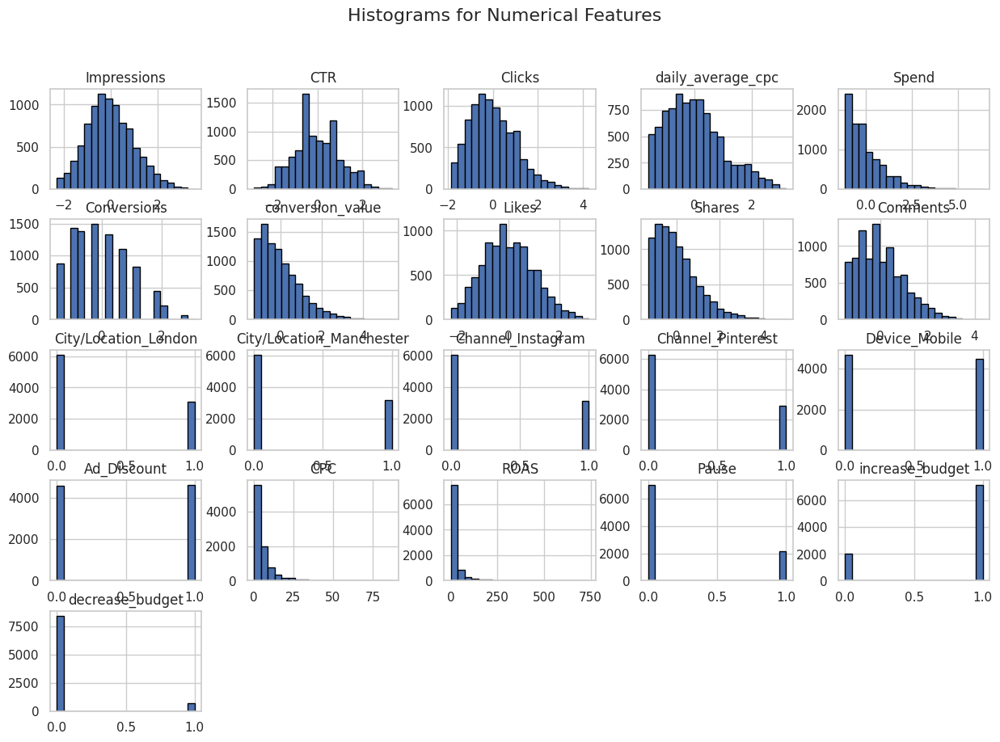

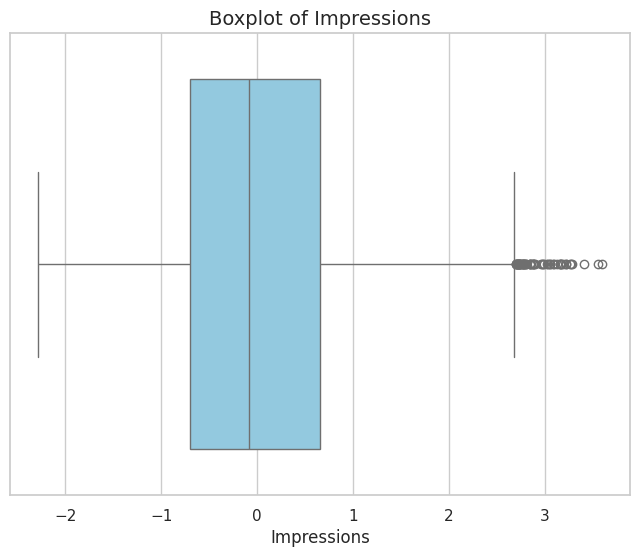

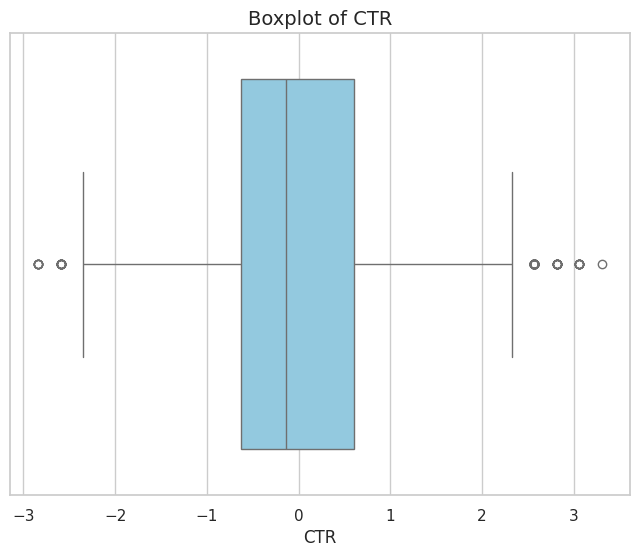

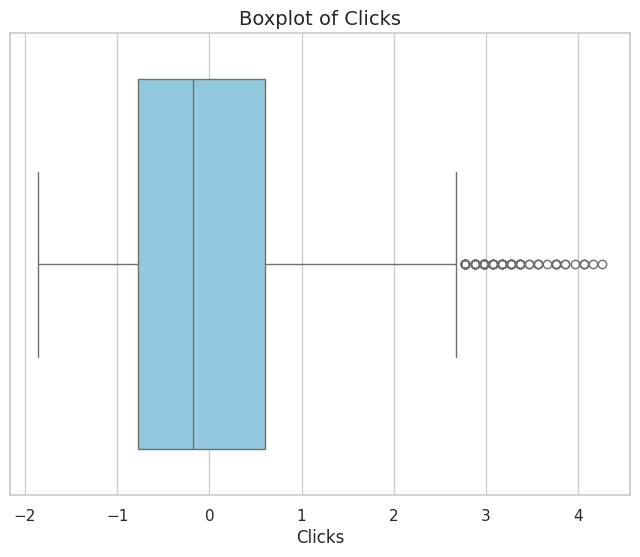

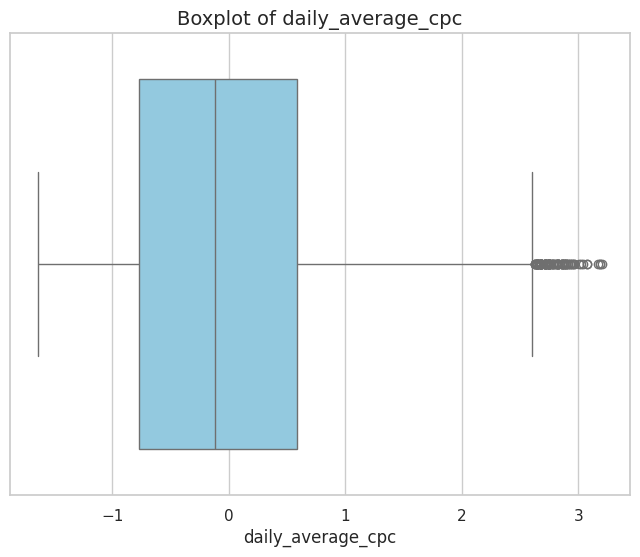

...

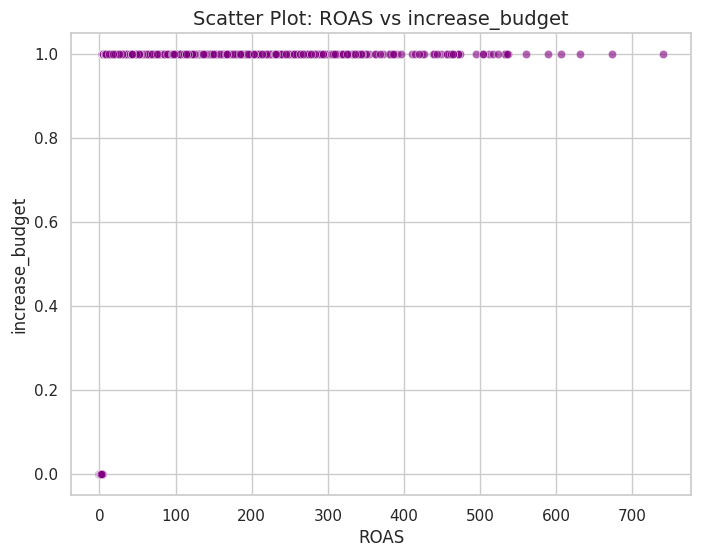

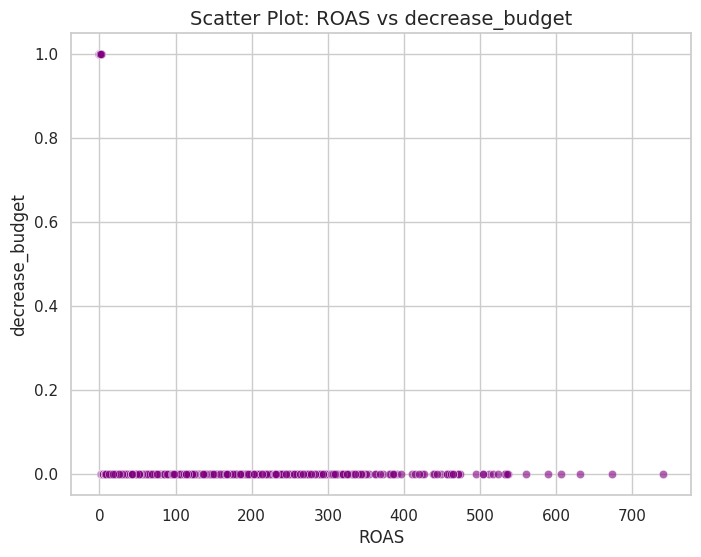

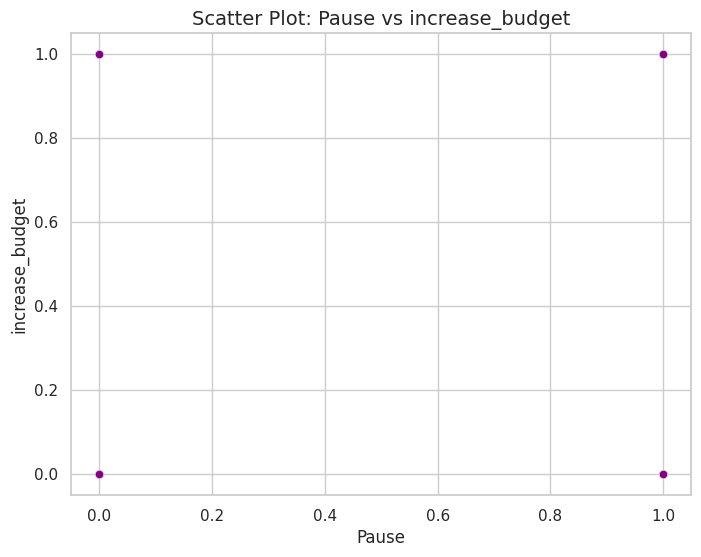

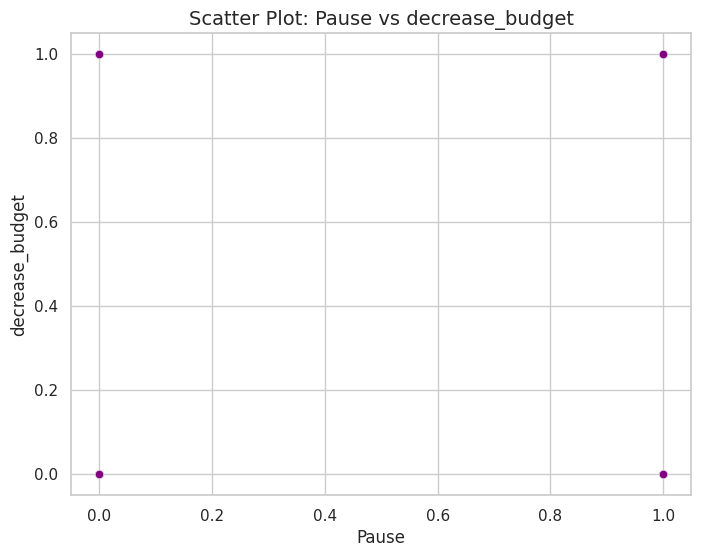

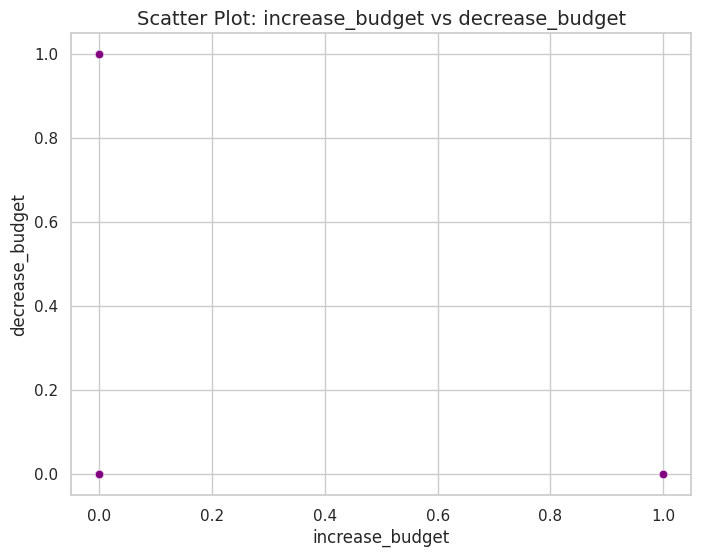

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_dataset(df):

    sns.set(style="whitegrid")
    print("Dataset Overview:\n")
    print(df.info())
    print("\nSummary Statistics:\n")
    print(df.describe())

    # 1. Histograms
    num_cols = df.select_dtypes(include=[np.number]).columns
    if len(num_cols) > 0:
        df[num_cols].hist(figsize=(15, 10), bins=20, edgecolor='black')
        plt.suptitle('Histograms for Numerical Features', fontsize=16)
        plt.show()

    # 2. Boxplots
    for col in num_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df[col], color='skyblue')
        plt.title(f'Boxplot of {col}', fontsize=14)
        plt.show()

    # 3. Pairplot
    if len(num_cols) <= 5:
        sns.pairplot(df[num_cols], diag_kind='kde', plot_kws={'alpha': 0.7})
        plt.suptitle('Pairplot of Numerical Features', fontsize=16)
        plt.show()

    # 4. Correlation Heatmap
    if len(num_cols) > 1:
        plt.figure(figsize=(10, 8))
        corr_matrix = df[num_cols].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True, cbar=True)
        plt.title('Correlation Heatmap', fontsize=16)
        plt.show()

    # 5. Bar Plots for Categorical Columns
    cat_cols = df.select_dtypes(include=['object', 'category']).columns
    for col in cat_cols:
        plt.figure(figsize=(8, 6))
        df[col].value_counts().plot(kind='bar', color='salmon', edgecolor='black')
        plt.title(f'Bar Plot of {col}', fontsize=14)
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.show()

    # 6. Scatterplots
    if len(num_cols) > 1:
        for i in range(len(num_cols)):
            for j in range(i + 1, len(num_cols)):
                plt.figure(figsize=(8, 6))
                sns.scatterplot(x=df[num_cols[i]], y=df[num_cols[j]], alpha=0.6, color='purple')
                plt.title(f'Scatter Plot: {num_cols[i]} vs {num_cols[j]}', fontsize=14)
                plt.xlabel(num_cols[i])
                plt.ylabel(num_cols[j])
                plt.show()

visualize_dataset(df)


##Campaign Decision


**PAUSE CAMPAIGN (CTR<1%)**

**What is CTR?**
Click-Through Rate (CTR) is a metric that measures the percentage of users who click on an advertisement after seeing it. A higher CTR indicates better engagement and relevance of the ad to the audience.

Ranges of CTR for Various Performance Levels
CTR can vary based on the platform (e.g., Google Ads, Facebook Ads) and the industry. General benchmarks are:

Excellent Performance: **CTR > 3%**

Indicates the ad is highly engaging and relevant to the audience.
Good Performance: CTR between **1% and 3%**

Suggests the ad is performing well and meeting expectations.
Poor Performance: CTR **< 1%**

Indicates low audience interest or relevance, requiring attention to targeting or ad content.

**Why is 1% a Good Cap?**

Threshold for Relevance:

1) A CTR of less than 1% often means the ad fails to engage the audience, signaling potential issues with targeting, creatives, or messaging.
Efficient Use of Budget:

2) Ads with CTR < 1% may waste budget on impressions without generating enough clicks, making the campaign cost-inefficient.
Industry Benchmark:

3) In most industries, a 1% CTR is considered the minimum benchmark for an ad to be deemed effective.

In [75]:
df['Pause'] = df['CTR'].apply(lambda ctr: 1 if ctr < 1.0 else 0)

**INCREASE BUDGET (ROAS>4)**

**What is ROAS?**

Return on Ad Spend (ROAS) is a metric that measures the revenue generated for every unit of currency spent on advertising. A higher ROAS indicates a highly efficient and profitable advertising campaign.

Ranges of ROAS for Various Performance Levels
Excellent Performance: **ROAS > 4**

The campaign is generating significant revenue compared to the spend.
Good Performance: ROAS between **2 and 4**

The campaign is profitable and meeting expectations.
Poor Performance: **ROAS < 2**

The campaign is underperforming and may need optimization.

**Why is ROAS > 4 a Good Benchmark to Increase Budget?**

1) A ROAS greater than 4 means that for every ₹1 spent on advertising, at least ₹4 in revenue is generated. This represents a highly profitable campaign.
Scalable Performance:

2) Campaigns with high ROAS suggest that the current strategy is effective and scalable. Increasing the budget can amplify returns while maintaining efficiency.
Optimal Allocation of Resources:

3) Increasing the budget for high-ROAS campaigns ensures that resources are focused on the most profitable campaigns, maximizing overall revenue.

In [76]:
df['increase_budget'] = df['ROAS'].apply(lambda roas: 1 if roas > 4.0 else 0)

**DECREASE BUDGET (ROAS<1.5)**

**Why is ROAS < 1.5 a Good Benchmark to Decrease Budget?**


1) A ROAS of less than 1.5 means that for every ₹1 spent on advertising, less than ₹1.50 in revenue is generated, leaving minimal or no profit margins.
Prevents Budget Wastage:

2) Continuing to allocate a significant budget to a low-performing campaign leads to wasted resources with little or no return.
Signals Poor Ad Efficiency:

3) ROAS < 1.5 suggests issues with the campaign, such as irrelevant targeting, weak creatives, or suboptimal audience engagement.
Allows for Reallocation:

4) Reducing the budget for underperforming campaigns frees up funds that can be redirected to better-performing campaigns, maximizing overall returns.
Helps Focus on Optimization:

5) Decreasing the budget prevents overspending while you analyze and fix the underlying issues, such as improving ad quality, adjusting targeting, or refining offers.


In [77]:
df['decrease_budget'] = df['ROAS'].apply(lambda roas: 1 if roas < 1.5 else 0)

##Model Training

In [78]:
df

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,conversion_value,Likes,Shares,Comments,...,City/Location_Manchester,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount,CPC,ROAS,Pause,increase_budget,decrease_budget
0,1110.8,1.9,21,1.39,29,1,51.84,45,4,3,...,0,0,0,0,0,29.000000,1.787586,0,0,0
1,1296.6,1.1,14,0.72,10,2,40.32,14,17,11,...,0,0,0,0,0,5.000000,4.032000,0,1,0
2,1264.4,1.3,17,0.38,6,4,53.76,24,1,8,...,0,0,0,0,0,1.500000,8.960000,0,1,0
3,837.8,1.6,13,0.58,8,3,25.92,59,10,6,...,0,0,0,0,0,2.666667,3.240000,0,0,0
4,1599.0,1.4,23,0.83,19,2,108.19,44,17,2,...,0,0,0,0,0,9.500000,5.694211,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9895,2382.0,1.2,29,0.24,7,4,365.00,95,20,4,...,1,0,1,1,1,1.750000,52.142857,0,1,0
9896,2238.0,1.0,21,0.81,17,6,341.00,82,18,8,...,1,0,1,1,1,2.833333,20.058824,0,1,0
9897,2423.0,1.3,31,0.31,9,3,232.00,64,12,5,...,1,0,1,1,1,3.000000,25.777778,0,1,0
9898,1778.0,1.1,19,0.88,17,4,305.00,88,15,1,...,1,0,1,1,1,4.250000,17.941176,0,1,0


In [79]:
df.columns

Index(['Impressions', 'CTR', 'Clicks', 'daily_average_cpc', 'Spend',
       'Conversions', 'conversion_value', 'Likes', 'Shares', 'Comments',
       'City/Location_London', 'City/Location_Manchester', 'Channel_Instagram',
       'Channel_Pinterest', 'Device_Mobile', 'Ad_Discount', 'CPC', 'ROAS',
       'Pause', 'increase_budget', 'decrease_budget'],
      dtype='object')

In [80]:
X = df.drop(columns=['conversion_value', 'ROAS', 'Pause', 'increase_budget', 'decrease_budget'])
y = df['ROAS']

In [81]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [82]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=42)

model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [83]:
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 602.1850787100867
R^2 Score: 0.7928113294082417


#Optimising

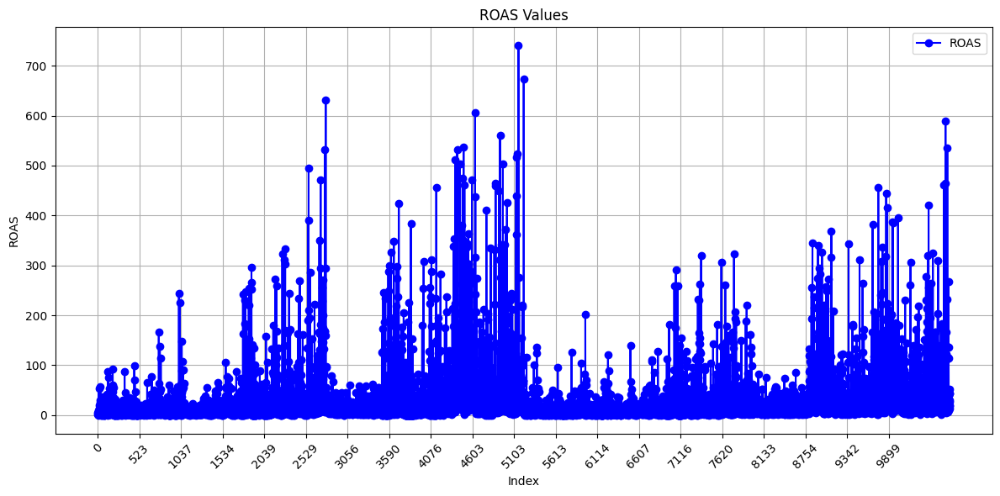

In [84]:
import matplotlib.pyplot as plt
import numpy as np

# Plot the ROAS values
plt.figure(figsize=(12, 6))
plt.plot(df['ROAS'], marker='o', linestyle='-', color='b', label='ROAS')

# Customizing the x-axis
plt.title('ROAS Values')
plt.xlabel('Index')
plt.ylabel('ROAS')
plt.legend()
plt.grid(True)

num_ticks = 20
indices = np.linspace(0, len(df) - 1, num=num_ticks, dtype=int)
plt.xticks(indices, labels=df.index[indices], rotation=45)

plt.tight_layout()
plt.show()


In [85]:
ranges_to_delete = [(2793, 3300), (5200, 6861), (8133, 8754)]

indices_to_drop = []
for start, end in ranges_to_delete:
    indices_to_drop.extend(range(start, end + 1))

ds = df.drop(indices_to_drop, errors='ignore').reset_index(drop=True)

print("New shape:", ds.shape)

New shape: (6633, 21)


In [86]:
X = ds.drop(columns=['conversion_value', 'ROAS', 'Pause', 'increase_budget', 'decrease_budget'])
y = ds['ROAS']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(random_state=42)

model.fit(X_train, y_train)

from sklearn.metrics import mean_squared_error, r2_score

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 733.5407249062624
R^2 Score: 0.7932760395598838


In [87]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = ds.drop(columns=['conversion_value', 'ROAS', 'Pause', 'increase_budget', 'decrease_budget'])
y = ds['ROAS']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(n_estimators=2000, random_state=42)  # Increased n_estimators
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 724.759105408983
R^2 Score: 0.7957508457975166


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

rf_base = RandomForestRegressor(
    n_estimators=rf.n_estimators,
    max_depth=rf.max_depth,
    random_state=42
)

ada_boost = AdaBoostRegressor(
    estimator=rf_base,
    n_estimators=50,
    learning_rate=0.1,
    random_state=42
)

# Train AdaBoost on the dataset
ada_boost.fit(X_train, y_train)

ada_boost_predictions = ada_boost.predict(X_test)
ada_boost_r2 = r2_score(y_test, ada_boost_predictions)
print("AdaBoost with Random Forest R²:", ada_boost_r2)

#Suggested Action

In [22]:
def predict_roas(model, scaler, feature_sequence):

    if len(feature_sequence) != len(X.columns):
        raise ValueError(f"Expected {len(X.columns)} features, got {len(feature_sequence)}")

    # Scale the input
    feature_sequence_scaled = scaler.transform([feature_sequence])

    # Predict ROAS
    roas_prediction = model.predict(feature_sequence_scaled)
    return roas_prediction[0]

In [ ]:
ds

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,conversion_value,Likes,Shares,Comments,...,City/Location_Manchester,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount,CPC,ROAS,Pause,increase_budget,decrease_budget
0,1110.8,1.9,21,1.39,29,1,51.84,45,4,3,...,0,0,0,0,0,29.000000,1.787586,0,0,0
1,1296.6,1.1,14,0.72,10,2,40.32,14,17,11,...,0,0,0,0,0,5.000000,4.032000,0,1,0
2,1264.4,1.3,17,0.38,6,4,53.76,24,1,8,...,0,0,0,0,0,1.500000,8.960000,0,1,0
3,837.8,1.6,13,0.58,8,3,25.92,59,10,6,...,0,0,0,0,0,2.666667,3.240000,0,0,0
4,1599.0,1.4,23,0.83,19,2,108.19,44,17,2,...,0,0,0,0,0,9.500000,5.694211,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6628,2382.0,1.2,29,0.24,7,4,365.00,95,20,4,...,1,0,1,1,1,1.750000,52.142857,0,1,0
6629,2238.0,1.0,21,0.81,17,6,341.00,82,18,8,...,1,0,1,1,1,2.833333,20.058824,0,1,0
6630,2423.0,1.3,31,0.31,9,3,232.00,64,12,5,...,1,0,1,1,1,3.000000,25.777778,0,1,0
6631,1778.0,1.1,19,0.88,17,4,305.00,88,15,1,...,1,0,1,1,1,4.250000,17.941176,0,1,0


In [23]:
# Input values for prediction in the specified order
feature_values = [1000, 2, 41, 0.2, 17, 2, 80, 10, 5, 1, 0, 1, 0, 1, 0, 5]

try:
    predicted_roas = predict_roas(rf, scaler, feature_values)
    print(f"Predicted ROAS: {predicted_roas}")
except ValueError as e:
    print(f"Error: {e}")


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Predicted ROAS: 10.483569638187184


In [24]:
'''df['Pause'] = df['CTR'].apply(lambda ctr: 1 if ctr < 1.0 else 0)
df['increase_budget'] = df['ROAS'].apply(lambda roas: 1 if roas > 4.0 else 0)
df['decrease_budget'] = df['ROAS'].apply(lambda roas: 1 if roas < 1.5 else 0)'''

if(feature_values[1] < 1.0):
  feature_values.insert(16,1)
  print("Pause Campaign")
else:
  feature_values.insert(16,0)

if(predicted_roas > 4.0):
  feature_values.insert(17,1)
  print("Increase Budget")
else:
  feature_values.insert(17,0)

if(predicted_roas < 1.5):
  feature_values.insert(18,1)
  print("Decrease Budget")
else:
  feature_values.insert(18,0)

Increase Budget


In [25]:
column_ranges1 = [ds.max()]
print("Range of each column:")
print(column_ranges1)

Range of each column:
[Impressions                 3725.00
CTR                            2.60
Clicks                        62.00
daily_average_cpc              2.68
Spend                        101.00
Conversions                   11.00
conversion_value             884.40
Likes                        148.00
Shares                        59.00
Comments                      29.00
City/Location_London           1.00
City/Location_Manchester       1.00
Channel_Instagram              1.00
Channel_Pinterest              1.00
Device_Mobile                  1.00
Ad_Discount                    1.00
CPC                           87.00
ROAS                         740.40
Pause                          1.00
increase_budget                1.00
decrease_budget                1.00
dtype: float64]


In [26]:
column_ranges1 = [ds.min()]
print("Range of each column:")
print(column_ranges1)

Range of each column:
[Impressions                 12.200000
CTR                          0.100000
Clicks                       0.000000
daily_average_cpc            0.010000
Spend                        1.000000
Conversions                  1.000000
conversion_value             0.000000
Likes                        0.000000
Shares                       0.000000
Comments                     0.000000
City/Location_London         0.000000
City/Location_Manchester     0.000000
Channel_Instagram            0.000000
Channel_Pinterest            0.000000
Device_Mobile                0.000000
Ad_Discount                  0.000000
CPC                          0.090909
ROAS                         0.000000
Pause                        0.000000
increase_budget              0.000000
decrease_budget              0.000000
dtype: float64]


In [27]:
import pandas as pd
import numpy as np

# Function to randomly generate feature values, predict ROAS, and take action
def generate_data_and_predict(model, scaler, num_samples=100):
    # Define the feature names and their min/max ranges
    features = [
        'Impressions', 'CTR', 'Clicks', 'daily_average_cpc', 'Spend',
        'Conversions', 'Likes', 'Shares', 'Comments', 'City/Location_London',
        'City/Location_Manchester', 'Channel_Instagram', 'Channel_Pinterest',
        'Device_Mobile', 'Ad_Discount', 'CPC'
    ]

    min_values = [12.2, 0.1, 0, 0.01, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.090909]
    max_values = [3725, 2.6, 62, 2.68, 101, 11, 148, 59, 29, 1, 1, 1, 1, 1, 1, 87]

    # Generate random data
    data = []
    for _ in range(num_samples):
        feature_values = [np.random.uniform(low, high) for low, high in zip(min_values, max_values)]

        # Predict ROAS
        predicted_roas = predict_roas(model, scaler, feature_values)

        # Add Pause Campaign condition
        if feature_values[1] < 1.0:
            feature_values.append(1)
            action = "Pause Campaign"
        else:
            feature_values.append(0)

        # Add Increase Budget condition
        if predicted_roas > 4.0:
            feature_values.append(1)
            action = "Increase Budget"
        else:
            feature_values.append(0)

        # Add Decrease Budget condition
        if predicted_roas < 1.5:
            feature_values.append(1)
            action = "Decrease Budget"
        else:
            feature_values.append(0)

        # Append predicted ROAS and action to the feature values
        feature_values.append(predicted_roas)
        feature_values.append(action)
        data.append(feature_values)

    columns = features + ['Pause Campaign', 'Increase Budget', 'Decrease Budget', 'Predicted ROAS', 'Action Taken']
    df = pd.DataFrame(data, columns=columns)

    return df

In [32]:
sd = generate_data_and_predict(rf, scaler, 2000)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ut

In [33]:
sd

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,Likes,Shares,Comments,City/Location_London,...,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount,CPC,Pause Campaign,Increase Budget,Decrease Budget,Predicted ROAS,Action Taken
0,1169.484468,1.424717,18.588801,0.943320,81.231263,5.066447,144.610472,41.577777,14.576208,0.493302,...,0.674271,0.218489,0.331130,0.234580,6.789090,0,1,0,6.093573,Increase Budget
1,525.753423,0.351588,4.187268,0.938813,87.845799,9.234064,99.965026,0.254935,8.524071,0.803407,...,0.802601,0.509953,0.685525,0.985090,85.597966,1,1,0,6.886490,Increase Budget
2,2755.325539,0.262798,45.243564,0.552880,14.377491,5.724565,34.028893,37.879831,15.633374,0.402740,...,0.858127,0.724249,0.042416,0.327111,7.988592,1,1,0,8.809095,Increase Budget
3,215.773453,0.255390,37.785168,2.437974,40.942887,8.017559,143.503892,42.472118,26.894174,0.535900,...,0.289129,0.430729,0.010479,0.661008,22.111364,1,1,0,6.321108,Increase Budget
4,3141.916954,0.958545,24.640027,1.460901,38.882950,1.582746,51.920146,39.781161,5.735148,0.356458,...,0.240164,0.772912,0.755369,0.313037,69.754247,1,0,0,2.923852,Pause Campaign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,3097.588643,2.144426,43.586000,1.972107,61.716877,10.008962,82.732855,14.623294,17.356552,0.174578,...,0.955315,0.661685,0.115138,0.826332,57.483548,0,0,0,3.298792,Increase Budget
1996,766.030998,0.914448,21.820549,0.731159,80.210098,4.885780,32.426361,48.901216,1.340780,0.365834,...,0.113619,0.564884,0.647035,0.493105,75.230167,1,1,0,4.959941,Increase Budget
1997,741.721449,0.275906,19.150864,1.547571,22.519697,1.265729,123.513112,13.849956,16.575471,0.839502,...,0.921738,0.266402,0.782582,0.865517,34.717292,1,1,0,6.940385,Increase Budget
1998,2733.953175,1.544337,7.007725,1.483974,34.413996,4.194654,56.854733,58.468309,28.592336,0.731293,...,0.331604,0.201579,0.134243,0.448465,75.967984,0,1,0,5.156954,Increase Budget


In [35]:
# Filter rows where any two of the three columns have a value of 1
filtered_sd = sd[~((sd['Pause Campaign'] + sd['Increase Budget'] + sd['Decrease Budget']) > 1)]

filtered_sd

,Impressions,CTR,Clicks,daily_average_cpc,Spend,Conversions,Likes,Shares,Comments,City/Location_London,...,Channel_Instagram,Channel_Pinterest,Device_Mobile,Ad_Discount,CPC,Pause Campaign,Increase Budget,Decrease Budget,Predicted ROAS,Action Taken
0,1169.484468,1.424717,18.588801,0.943320,81.231263,5.066447,144.610472,41.577777,14.576208,0.493302,...,0.674271,0.218489,0.331130,0.234580,6.789090,0,1,0,6.093573,Increase Budget
4,3141.916954,0.958545,24.640027,1.460901,38.882950,1.582746,51.920146,39.781161,5.735148,0.356458,...,0.240164,0.772912,0.755369,0.313037,69.754247,1,0,0,2.923852,Pause Campaign
5,1132.722471,2.327558,8.987035,0.350333,19.286390,10.074039,35.135690,7.286399,21.053206,0.620978,...,0.114839,0.929344,0.768633,0.219325,83.567437,0,1,0,11.618079,Increase Budget
6,1701.382703,1.117597,55.421710,1.846574,14.424805,6.949953,87.067759,51.457467,15.574780,0.124855,...,0.128677,0.345528,0.519110,0.155912,20.734395,0,1,0,6.390876,Increase Budget
8,2401.195667,1.194342,41.073102,2.451149,24.607430,9.028584,9.558560,57.694838,28.152249,0.438370,...,0.378796,0.992437,0.542080,0.651781,77.831560,0,1,0,5.418032,Increase Budget
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,280.931647,1.599449,20.442941,0.059410,11.472700,6.116340,25.927180,4.378454,18.804861,0.795972,...,0.584655,0.887285,0.146729,0.122358,27.367418,0,1,0,14.526609,Increase Budget
1994,581.353264,1.212353,59.256314,2.541826,81.579793,3.942358,130.257046,1.810755,6.390092,0.407114,...,0.512611,0.064968,0.033699,0.979250,16.249718,0,1,0,5.792104,Increase Budget
1995,3097.588643,2.144426,43.586000,1.972107,61.716877,10.008962,82.732855,14.623294,17.356552,0.174578,...,0.955315,0.661685,0.115138,0.826332,57.483548,0,0,0,3.298792,Increase Budget
1998,2733.953175,1.544337,7.007725,1.483974,34.413996,4.194654,56.854733,58.468309,28.592336,0.731293,...,0.331604,0.201579,0.134243,0.448465,75.967984,0,1,0,5.156954,Increase Budget


#LLM

In [36]:
pip install openai

In [88]:
import openai
openai.api_key = "**hidden**"

In [89]:
from openai.types import ChatModel

In [92]:
import os
from openai import OpenAI

client = OpenAI(api_key="**hidden**")

def get_feedback(feature_values, predicted_roas, action_taken):

    messages = [
        {
            "role": "user",
            "content": f"""
            You are a marketing optimization expert. A user has provided the following campaign details:
            Feature Values: {feature_values}
            Predicted ROAS: {predicted_roas}
            Action Taken: {action_taken}

            Based on this, provide detailed feedback for improving their campaign, focusing on:
            - Highlighting any feature value outside recommended ranges.
            - Suggestions to improve ROAS and overall campaign performance.
            """
        }
    ]

    chat_completion = client.chat.completions.create(
        messages=messages,
        model="gpt-4o"
    )

    return chat_completion.choices[0].message.content.strip()

# Example usage
feature_values = {
    "Impressions": 1000,
    "CTR": 0.9,
    "Clicks": 40,
    "daily_average_cpc": 0.3,
}
predicted_roas = 3.5
action_taken = "Increase Budget"

feedback = get_feedback(feature_values, predicted_roas, action_taken)
print("Feedback from GPT:")
print(feedback)

Feedback from GPT:
Based on the campaign details provided, let's analyze the feature values and predicted ROAS to offer concrete feedback and recommendations for improvement:

### Analysis of Current Feature Values:

1. **Impressions: 1000**
   - Generally, a good number of impressions indicate that your ad is being shown frequently. However, to see if this is optimal, we need to compare with the industry standards and your past performances if data is available.

2. **CTR (Click-Through Rate): 0.9%**
   - A CTR of 0.9% can be considered low depending on the industry average. Most industries aim for a CTR closer to 2% or higher, although benchmarks vary. A CTR below 1% typically indicates that the ad material (text, image, or targeting) might not be compelling enough to encourage clicks.

3. **Clicks: 40**
   - This value ties directly to your CTR and impressions. Increasing CTR will inherently lead to more clicks if impressions remain constant.

4. **Daily Average CPC (Cost Per Click)

PROMPT ENGINEERING

In [93]:
import os
from openai import OpenAI

client = OpenAI(api_key="**hidden**")

def get_feedback(feature_values, predicted_roas, action_taken):

    messages = [
    {
        "role": "user",
        "content": f"""
        You are a marketing optimization expert. A user has provided the following campaign details:
        Feature Values: {feature_values}
        Predicted ROAS: {predicted_roas}
        Action Taken: {action_taken}

        Based on this, analyze the campaign and provide detailed feedback in the following structured format:

        ### Metrics Performing Bad
        For each metric underperforming, provide:
        a) **What does this value mean about the nature of the ad?**
           - Analyze whether the metric indicates good or poor performance. Explain if the current value is sufficient or inadequate.
        b) **What should you aim for?**
           - Compare the value with assumed industry standards or benchmarks and recommend a target value to aim for.
        c) **Identify possible issues.**
           - Highlight potential causes for the underperformance. Discuss why these issues may have arisen and their impact on the ad.
        d) **In-depth solutions.**
           - Offer detailed, actionable steps to address each issue identified in part (c). Ensure these solutions are practical and align with industry-level strategies.

        ### Metrics Performing Well
        For each well-performing metric, provide:
        a) **What does this value mean about the nature of the ad?**
           - Describe the significance of the value and explain what it reveals about the ad's performance.
        b) **Steps to further improve it.**
           - Suggest comprehensive and advanced strategies to enhance this metric even further. Focus on industry-level insights and avoid basic points.

        All feedback should be detailed and relevant to the industry, avoiding basic suggestions or one-liners. Ensure every point provides significant value and actionable insights.
        """
    }
    ]

    chat_completion = client.chat.completions.create(
        messages=messages,
        model="gpt-4o"
    )

    return chat_completion.choices[0].message.content.strip()

# Example usage
feature_values = {
    "Impressions": 1000,
    "CTR": 0.9,
    "Clicks": 40,
    "daily_average_cpc": 0.3,
}
predicted_roas = 3.5
action_taken = "Increase Budget"

feedback = get_feedback(feature_values, predicted_roas, action_taken)
print("Feedback from GPT:")
print(feedback)

Feedback from GPT:
Certainly! Let's analyze the campaign based on the metrics provided:

### Metrics Performing Bad

#### Impressions
a) **What does this value mean about the nature of the ad?**
   - The impression count of 1000 suggests a limited reach. Compared to industry norms, especially in digital advertising, this indicates that the ad's visibility is quite low, probably affecting brand awareness and overall reach.

b) **What should you aim for?**
   - Depending on the platform and industry, aiming for at least 5000-10,000 daily impressions might be more appropriate. This level can help ensure your ad reaches a broader audience and has a better chance of capturing interested viewers.

c) **Identify possible issues.**
   - Potential targeting issues could be restricting the audience reach. The ad creative might not be compelling enough to drive higher exposure, or it's being shown at sub-optimal times.

d) **In-depth solutions.**
   - **Refine Targeting:** Analyze your audience d

EMBEDDING

In [94]:
feature_values = {
    "Impressions": 1000,
    "CTR": 0.9,
    "Clicks": 40,
    "daily_average_cpc": 0.3,

}
predicted_roas = 3.5
action_taken = "Increase Budget"
input_prompt=f"""
        You are a marketing optimization expert. A user has provided the following campaign details:
        Feature Values: {feature_values}
        Predicted ROAS: {predicted_roas}
        Action Taken: {action_taken}

        Based on this, analyze the campaign and provide detailed feedback in the following structured format:

        ### Metrics Performing Bad
        For each metric underperforming, provide:
        a) **What does this value mean about the nature of the ad?**
           - Analyze whether the metric indicates good or poor performance. Explain if the current value is sufficient or inadequate.
        b) **What should you aim for?**
           - Compare the value with assumed industry standards or benchmarks and recommend a target value to aim for.
        c) **Identify possible issues.**
           - Highlight potential causes for the underperformance. Discuss why these issues may have arisen and their impact on the ad.
        d) **In-depth solutions.**
           - Offer detailed, actionable steps to address each issue identified in part (c). Ensure these solutions are practical and align with industry-level strategies.

        ### Metrics Performing Well
        For each well-performing metric, provide:
        a) **What does this value mean about the nature of the ad?**
           - Describe the significance of the value and explain what it reveals about the ad's performance.
        b) **Steps to further improve it.**
           - Suggest comprehensive and advanced strategies to enhance this metric even further. Focus on industry-level insights and avoid basic points.

        All feedback should be detailed and relevant to the industry, avoiding basic suggestions or one-liners. Ensure every point provides significant value and actionable insights.
        """

# GPT response
gpt_response = """Certainly! Let's analyze the campaign based on the metrics provided:

### Metrics Performing Bad

#### Impressions
a) **What does this value mean about the nature of the ad?**
   - The impression count of 1000 suggests a limited reach. Compared to industry norms, especially in digital advertising, this indicates that the ad's visibility is quite low, probably affecting brand awareness and overall reach.

b) **What should you aim for?**
   - Depending on the platform and industry, aiming for at least 5000-10,000 daily impressions might be more appropriate. This level can help ensure your ad reaches a broader audience and has a better chance of capturing interested viewers.

c) **Identify possible issues.**
   - Potential targeting issues could be restricting the audience reach. The ad creative might not be compelling enough to drive higher exposure, or it's being shown at sub-optimal times.

d) **In-depth solutions.**
   - **Refine Targeting:** Analyze your audience demographics and interests carefully. Use A/B testing to find the optimal audience segments.
   - **Enhance Ad Creative:** Improve the visual appeal and messaging in your ads. Use eye-catching visuals or videos and ensure the copy aligns well with audience interests to boost engagements.
   - **Ad Placement and Timing:** Use analytics to identify peak times for your target audience and adjust ad scheduling accordingly. Ensure your ad placement is on platforms where your audience is most active.

#### Clicks (relative to CTR)
a) **What does this value mean about the nature of the ad?**
   - While the Click-Through Rate (CTR) is high at 0.9 (90%), the absolute number of clicks is fairly low (40), indicating weak conversion in terms of actual interactions driven by the ad.

b) **What should you aim for?**
   - For effective performance, a significantly higher number of clicks should be the target without compromising the CTR. At least doubling the clicks to 80 or more should be considered, ensuring higher conversions and engagement rates.

c) **Identify possible issues.**
   - Discrepancies between high CTR and low click numbers might stem from limited audience size or lack of persuasive call-to-action (CTA), failing to convert impressions into actions.

d) **In-depth solutions.**
   - **Expand Audience Reach:** By increasing the impressions as discussed, more people can see and interact with the ads.
   - **Refine Call-to-Action:** Ensure that the CTA is compelling, clear, and urges immediate action. Test different CTAs to identify the most effective one for your audience.
   - **Optimize Landing Pages:** Ensure that your landing pages are well-designed, engaging, and mobile-friendly to prevent drop-offs post-click.

### Metrics Performing Well

#### CTR (Click-Through Rate)
a) **What does this value mean about the nature of the ad?**
   - A CTR of 0.9 (90%) is exceptionally high, indicating that the ad content is highly relevant and engaging to the audience it's reaching. It's an indication that the creative and message resonate well with the viewers.

b) **Steps to further improve it.**
   - **Leverage Dynamic Content Personalization:** Use technology to personalize ads based on user behavior and preferences, enhancing engagement levels further.
   - **Continued Ad Optimization:** Continually test various elements of the ad, like headlines, visuals, and ad formats, to keep the engagement fresh and appealing.
   - **Exploit Retargeting Strategies:** Implement retargeting strategies to capture and convert interested audiences who have interacted with your ads previously but haven't completed the desired action.

By addressing these areas, the campaign can significantly improve its performance, ultimately raising its effectiveness and return on advertising spend (ROAS)."""

# User's correction to GPT response
corrected_feedback = """
### Metrics Performing Bad

#### Impressions
a) **What does this value mean about the nature of the ad?**
   - The impression count of 1,000 highlights a restricted audience reach, indicating that the ad's visibility is insufficient to create meaningful brand awareness. In digital advertising, impressions reflect how often your ad is displayed to users, and a low count suggests limited exposure, potentially due to narrow targeting or underfunded campaigns. When compared to industry benchmarks, this performance points to an underperforming ad campaign, undermining its ability to reach new prospects and build top-of-mind awareness.

b) **What should you aim for?**
   - A realistic goal is to achieve at least 5,000–10,000 daily impressions, varying based on platform norms, industry size, and campaign objectives. Such numbers ensure the ad reaches a wider audience, boosting the likelihood of engagement and conversion. For high-traffic platforms like Facebook or Google Ads, these benchmarks align with healthy reach metrics, fostering better campaign outcomes.

c) **Identify possible issues.**
   - Several factors could contribute to the limited impressions:
     1. **Targeting Constraints:** The ad's audience may be too narrowly defined, excluding potential segments.
     2. **Creative Quality:** The ad design or content may fail to capture attention, reducing user engagement and visibility.
     3. **Budget or Bid Issues:** A low budget or insufficient bid in a competitive ad auction could limit ad placements.
     4. **Suboptimal Timing:** The ad may be shown during times when the target audience is less active, reducing exposure.

d) **In-depth solutions.**
   - **Refine Targeting:**
     - Reevaluate your audience settings, including demographics, interests, and geographic reach. Use A/B testing to determine which audience segments respond best to your ads.
   - **Enhance Ad Creative:**
     - Improve visuals by incorporating high-quality images, animations, or videos that capture attention. Revise copy to ensure it aligns with your audience's needs, using persuasive, action-oriented language.
   - **Adjust Budget and Bidding Strategy:**
     - Increase your ad budget if feasible and use automated bidding strategies to optimize for reach.
   - **Optimize Timing and Placement:**
     - Leverage analytics to pinpoint peak engagement times for your audience. Schedule ads during these periods and focus placements on platforms where your target demographic is most active.

---

#### Clicks (relative to CTR)
a) **What does this value mean about the nature of the ad?**
   - A high CTR of 0.9 (90%) reflects that the ad content resonates well with the audience, enticing them to click. However, the absolute click count of 40 indicates that the overall audience size is too small, limiting the total interactions despite strong ad engagement. This imbalance suggests an untapped potential for conversions and highlights the need for scaling reach.

b) **What should you aim for?**
   - To capitalize on the strong CTR, aim to double or triple the click count to at least 80–120, which would enhance overall engagement and potential conversions. Maintaining a balance between a high CTR and a higher volume of clicks ensures that the ad reaches and resonates with a broader audience.

c) **Identify possible issues.**
   - **Small Audience Size:** A limited reach directly restricts the number of clicks.
   - **Unclear CTA:** The call-to-action might not compel users to act, reducing the likelihood of clicking.
   - **Landing Page Drop-offs:** A poorly designed or irrelevant landing page could discourage users post-click, diminishing the overall effectiveness of the ad.

d) **In-depth solutions.**
   - **Expand Audience Reach:**
     - Build upon the impression strategies to increase visibility, enabling more users to interact with your ad.
   - **Strengthen CTA Messaging:**
     - Craft CTAs that are direct, urgent, and aligned with user interests, such as "Shop Now," "Sign Up for Free," or "Discover More." Test various options to determine the most effective approach.
   - **Optimize Landing Pages:**
     - Ensure landing pages are responsive, visually appealing, and relevant to the ad content. Streamline navigation and minimize load times to improve user retention and conversion rates.

---

### Metrics Performing Well

#### CTR (Click-Through Rate)
a) **What does this value mean about the nature of the ad?**
   - A CTR of 0.9 (90%) is an excellent indicator of ad performance. It signifies that the ad content, targeting, and placement align perfectly with the audience's expectations and preferences. This level of engagement demonstrates that the ad grabs attention and encourages users to take action, marking it as highly relevant and effective.

b) **Steps to further improve it:**
   - **Leverage Dynamic Content Personalization:**
     - Use tools that adapt ad content dynamically based on user behavior, search history, and preferences to further boost engagement.
   - **Continued Ad Optimization:**
     - Periodically refresh visuals, copy, and formats to maintain user interest. A/B test variations to identify the most effective components.
   - **Retargeting Strategies:**
     - Implement strategies to re-engage users who interacted with the ad but didn’t convert. This includes targeting website visitors or those who abandoned carts with tailored follow-up ads.

By systematically addressing these insights and improvements, the campaign's performance can be scaled effectively, ensuring better return on advertising spend (ROAS) and achieving long-term marketing objectives."""

feedback_log = {
    "prompt": input_prompt,
    "output": gpt_response,
    "correction": corrected_feedback
}

# Save to file
import json
with open("feedback_log.json", "a") as f:
    f.write(json.dumps(feedback_log) + "\n")
